In [ ]:
### CHECK GPU:
## memory footprint support libraries/code
# !ln -sf /opt/bin/nvidia-smi /usr/bin/nvidia-smi
!pip install gputil
!pip install psutil
!pip install humanize

import psutil
import humanize
import os
import GPUtil as GPU
GPUs = GPU.getGPUs()

# XXX: only one GPU on Colab and isn’t guaranteed
gpu = GPUs[0]
def printm():
  process = psutil.Process(os.getpid())
  print("Gen RAM Free: " + humanize.naturalsize( psutil.virtual_memory().available ), " | Proc size: " + humanize.naturalsize( process.memory_info().rss))
  print("GPU RAM Free: {0:.0f}MB | Used: {1:.0f}MB | Util {2:3.0f}% | Total {3:.0f}MB".format(gpu.memoryFree, gpu.memoryUsed, gpu.memoryUtil*100, gpu.memoryTotal))

printm()

Gen RAM Free: 26.2 GB  | Proc size: 119.1 MB
GPU RAM Free: 16280MB | Used: 0MB | Util   0% | Total 16280MB


In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
#### INSTALL & UNZIP DATASET ####
## https://www.kaggle.com/general/74235
# ! pip install -q kaggle


# from google.colab import files
# files.upload()

# ! mkdir ~/.kaggle
# ! cp kaggle.json ~/.kaggle/

# ! chmod 600 ~/.kaggle/kaggle.json

# ! kaggle datasets download -d andyczhao/covidx-cxr2

# ! unzip /content/covidx-cxr2.zip


In [ ]:
#### PRE-PROCESS DATASET ####
# %% Pre-process Data (Need one initial run to pre-optimize dataset):
# from google.colab import files
# files.upload()
# %run -i /content/tool_data_gen.py

In [ ]:
"""
This main would predict covid
"""
# %% Import
###############
##### LIB #####
###############
import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)
import matplotlib.pyplot as plt
import seaborn as sns

import os
import sys

from dataclasses import dataclass, field
from typing import Dict, Any, List, Optional

import datetime

from PIL import Image

# ML:
import torch
import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optim
from torchvision import datasets, transforms
from torch.utils.data import Dataset
import torchvision.models as models

#######################
##### LOCAL LIB #######
#######################
## USER DEFINED:
ABS_PATH = "/content/drive/MyDrive/dataset-folder" # Define ur absolute path here

## Custom Files:
def abspath(relative_path):
    return os.path.join(ABS_PATH, relative_path)

module_path = os.path.abspath(os.path.join('..'))
if module_path not in sys.path:
  sys.path.append(abspath("lib"))
import jx_lib
import jx_pytorch_lib

In [ ]:
# %% USER OPTION: ----- ----- ----- ----- ----- ----- ----- ----- ----- #
#######################
##### PREFERENCE ######
#######################
# SELECTED_TARGET = "1LAYER" # <--- select model !!!
SELECTED_TARGET = "CUSTOM-MODEL" # <--- select model !!!
USE_PREPROCESS_AUGMENTED_CUSTOM_DATASET_400 = False # use 400x400 resolution
USE_PREPROCESS_CUSTOM_DATASET = True # True, to use dataset generated by 'tool_data_gen.py' (differential RGB only)
USE_PREPROCESS_AUGMENTED_CUSTOM_DATASET = True # True, to use dataset generated by 'tool_data_gen.py' (differential RGB  + Augmentation)
PRINT_SAMPLES = True
OUTPUT_MODEL = False


In [ ]:
# %% LOAD DATASET INFO: ----- ----- ----- ----- ----- ----- ----- ----- ----- ----- #
#######################
##### LOAD DATASET ####
#######################
LUT_HEADER = ["[patient id]", "[filename]", "[class]", "[data source]"]
# import data
if USE_PREPROCESS_AUGMENTED_CUSTOM_DATASET:
    TRAIN_DATA_LUT = pd.read_csv(abspath("data/pre-processed-[train].txt"), sep=" ", header=None, names=LUT_HEADER)
else:
    TRAIN_DATA_LUT = pd.read_csv(abspath("data/train.txt"), sep=" ", header=None, names=LUT_HEADER)
VALID_DATA_LUT = pd.read_csv(abspath("data/test.txt"), sep=" ", header=None, names=LUT_HEADER)
# convert class to label 'y'
LABEL_TO_INT_LUT = {
    "positive": 1,
    "negative": 0,
}
INT_TO_LABEL_LUT = {
    1: "positive",
    0: "negative",
}
def class_to_binary(cls):
    return [LABEL_TO_INT_LUT[c] for c in cls]
TRAIN_DATA_LUT["Y"] = class_to_binary(TRAIN_DATA_LUT["[class]"])
VALID_DATA_LUT["Y"] = class_to_binary(VALID_DATA_LUT["[class]"])
# convert filename to absolute path:
def filename_to_abspath(filenames, tag):
    return [abspath("data/{}/{}".format(tag, filename)) for filename in filenames]
if USE_PREPROCESS_AUGMENTED_CUSTOM_DATASET_400:
    TRAIN_DATA_LUT["img_abs_path"] = filename_to_abspath(filenames=TRAIN_DATA_LUT["[filename]"], tag="train-custom-with-aug-400")
    VALID_DATA_LUT["img_abs_path"] = filename_to_abspath(filenames=VALID_DATA_LUT["[filename]"], tag="valid-custom-400")
elif USE_PREPROCESS_AUGMENTED_CUSTOM_DATASET:
    TRAIN_DATA_LUT["img_abs_path"] = filename_to_abspath(filenames=TRAIN_DATA_LUT["[filename]"], tag="train-custom-with-aug")
    VALID_DATA_LUT["img_abs_path"] = filename_to_abspath(filenames=VALID_DATA_LUT["[filename]"], tag="valid-custom")
elif USE_PREPROCESS_CUSTOM_DATASET:
    TRAIN_DATA_LUT["img_abs_path"] = filename_to_abspath(filenames=TRAIN_DATA_LUT["[filename]"], tag="train-custom")
    VALID_DATA_LUT["img_abs_path"] = filename_to_abspath(filenames=VALID_DATA_LUT["[filename]"], tag="valid-custom")
else:
    TRAIN_DATA_LUT["img_abs_path"] = filename_to_abspath(filenames=TRAIN_DATA_LUT["[filename]"], tag="train")
    VALID_DATA_LUT["img_abs_path"] = filename_to_abspath(filenames=VALID_DATA_LUT["[filename]"], tag="test")

# report status:
def report_status(data, tag):
    tp, tn = np.sum(data["Y"] == 1), np.sum(data["Y"] == 0)
    print("{}: +:{}, -:{}".format(tag, tp, tn))

report_status(data=TRAIN_DATA_LUT, tag="train")
report_status(data=VALID_DATA_LUT, tag="valid")


train: +:4315, -:4315
valid: +:200, -:200


In [ ]:
tick = 0
for path in TRAIN_DATA_LUT["img_abs_path"]:
  if os.path.isfile(path):
    tick += 1
  else:
    print("Missing: ", path)

print("Number of Existed Files:  ",tick)

Number of Existed Files:   8630


In [ ]:
# %% BALANCE TRAINING DATASET -------------------------------- ####
"""
    Since we notice the imbalance in training dataset, let's try random downsampling.
"""
train_pos = TRAIN_DATA_LUT[TRAIN_DATA_LUT["Y"] == 1]
train_neg = TRAIN_DATA_LUT[TRAIN_DATA_LUT["Y"] == 0]
N_balanced = min(len(train_pos), len(train_neg))
# shuffle and resample:
train_pos = train_pos[0:N_balanced]
train_neg = train_neg[0:N_balanced]
NEW_TRAIN_DATA_LUT = pd.concat([train_pos, train_neg])
report_status(data=train_pos, tag="new:train_pos")
report_status(data=train_neg, tag="new:train_neg")
report_status(data=NEW_TRAIN_DATA_LUT, tag="new:train")
TRAIN_DATA_LUT = NEW_TRAIN_DATA_LUT


new:train_pos: +:4315, -:0
new:train_neg: +:0, -:4315
new:train: +:4315, -:4315


In [ ]:
# %% DEFAULT CONFIG: ----- ----- ----- ----- ----- ----- ----- ----- ----- #
@dataclass
class PredictorConfiguration:
    MODEL_TAG            : str              = "default"
    OUT_DIR              : str              = ""
    OUT_DIR_MODELS       : str              = ""
    VERSION              : str              = "default"
    # Settings:
    TOTAL_NUM_EPOCHS     : int              = 5
    LEARNING_RATE        : float            = 0.001
    BATCH_SIZE           : int              = 1000
    LOSS_FUNC            : nn               = nn.NLLLoss()
    OPTIMIZER            : optim            = None
    # early stopping:
    EARLY_STOPPING_DECLINE_CRITERION  : int = 5


In [ ]:

# %% MODEL:
class BasicBlock(nn.Module):
    expansion = 1

    def __init__(self, inplanes, planes, stride=1, downsample=None):
        super().__init__()
        self.conv1 = nn.Conv2d(inplanes, planes, kernel_size=3, stride=stride, padding=1, bias=False)
        self.bn1 = nn.BatchNorm2d(planes)
        self.relu = nn.ReLU(inplace=True)
        self.conv2 = nn.Conv2d(planes, planes, kernel_size=3, stride=1, padding=1, bias=False)
        self.bn2 = nn.BatchNorm2d(planes)
        self.downsample = downsample
        self.stride = stride

    def forward(self, x):
        identity = x

        out = self.conv1(x)
        out = self.bn1(out)
        out = self.relu(out)

        out = self.conv2(out)
        out = self.bn2(out)

        if self.downsample is not None:
            identity = self.downsample(x)

        out += identity
        out = self.relu(out)

        return out
class ResNet(nn.Module):
    
    def __init__(self, block, layers, num_classes=1000):
        super().__init__()
        
        self.inplanes = 64

        self.conv1 = nn.Conv2d(3, self.inplanes, kernel_size=7, stride=2, padding=3, bias=False)
        self.bn1 = nn.BatchNorm2d(self.inplanes)
        self.relu = nn.ReLU(inplace=True)
        self.maxpool = nn.MaxPool2d(kernel_size=3, stride=2, padding=1)
        
        self.layer1 = self._make_layer(block, 64, layers[0])
        self.layer2 = self._make_layer(block, 128, layers[1], stride=2)
        self.layer3 = self._make_layer(block, 256, layers[2], stride=2)
        self.layer4 = self._make_layer(block, 512, layers[3], stride=2)
        
        self.avgpool = nn.AdaptiveAvgPool2d((1, 1))
        self.fc = nn.Linear(512 , num_classes)


    def _make_layer(self, block, planes, blocks, stride=1):
        downsample = None  

        if stride != 1 or self.inplanes != planes:
            downsample = nn.Sequential(
                nn.Conv2d(self.inplanes, planes, 1, stride, bias=False),
                nn.BatchNorm2d(planes),
            )

        layers = []
        layers.append(block(self.inplanes, planes, stride, downsample))
        
        self.inplanes = planes
        
        for _ in range(1, blocks):
            layers.append(block(self.inplanes, planes))

        return nn.Sequential(*layers)
    
    
    def forward(self, x):
        x = self.conv1(x)           # 224x224
        x = self.bn1(x)
        x = self.relu(x)
        x = self.maxpool(x)         # 112x112

        x = self.layer1(x)          # 56x56
        x = self.layer2(x)          # 28x28
        x = self.layer3(x)          # 14x14
        x = self.layer4(x)          # 7x7

        x = self.avgpool(x)         # 1x1
        x = torch.flatten(x, 1)     # remove 1 X 1 grid and make vector of tensor shape 
        x = self.fc(x)

        return x


In [ ]:
# %% INIT: ----- ----- ----- ----- ----- ----- ----- ----- ----- ----- #
#############################
##### MODEL DEFINITION ######
#############################
### MODEL ###
MODEL_DICT = {
    "CUSTOM-MODEL": {
        "model":
            nn.Sequential(
                # Feature Extraction:
                ResNet(BasicBlock, [3, 4, 6, 3], num_classes=2), # ResNet 34
                # Classifier:
                nn.Softmax(dim=1),
            ),
        "config":
            PredictorConfiguration(
                VERSION="v6-custom-with-aug-10",
                OPTIMIZER=optim.SGD,
                LEARNING_RATE=0.01,
                BATCH_SIZE=50,
                TOTAL_NUM_EPOCHS=200,#50
                EARLY_STOPPING_DECLINE_CRITERION=30,# No stopping
            ),
            # PredictorConfiguration(
            #     VERSION="v6-custom-with-aug-3",
            #     OPTIMIZER=optim.SGD,
            #     LEARNING_RATE=0.005,
            #     BATCH_SIZE=30,
            #     TOTAL_NUM_EPOCHS=20,#50
            #     EARLY_STOPPING_DECLINE_CRITERION=5,# No stopping
            # ),
                # transforms.Resize(300),
                # transforms.CenterCrop(300),
        "transformation":
            transforms.Compose([
                # same:
                # transforms.Resize(320),
                transforms.CenterCrop(320),
                transforms.ToTensor(),
                transforms.Normalize((0.5), (0.5)),
            ]),
    },
}

In [ ]:
#############################
##### MODEL AUTOMATION ######
#############################
# select model:
SELECTED_NET_MODEL = MODEL_DICT[SELECTED_TARGET]["model"]
SELECTED_NET_CONFIG = MODEL_DICT[SELECTED_TARGET]["config"]
SELECTED_NET_TRANSFORMATION = MODEL_DICT[SELECTED_TARGET]["transformation"]
# model specific declaration:
SELECTED_NET_CONFIG.MODEL_TAG = SELECTED_TARGET
SELECTED_NET_CONFIG.OPTIMIZER = SELECTED_NET_CONFIG.OPTIMIZER(
    SELECTED_NET_MODEL.parameters(), lr=SELECTED_NET_CONFIG.LEARNING_RATE
)
### Directory generation ###
OUT_DIR = abspath("output")
MODEL_OUT_DIR = "{}/{}".format(OUT_DIR, SELECTED_TARGET)
SELECTED_NET_CONFIG.OUT_DIR = "{}/{}".format(MODEL_OUT_DIR, SELECTED_NET_CONFIG.VERSION)
SELECTED_NET_CONFIG.OUT_DIR_MODELS = "{}/{}".format(SELECTED_NET_CONFIG.OUT_DIR, "models")
jx_lib.create_folder(DIR=OUT_DIR)
jx_lib.create_folder(DIR=MODEL_OUT_DIR)
jx_lib.create_folder(DIR=SELECTED_NET_CONFIG.OUT_DIR)
jx_lib.create_folder(DIR=SELECTED_NET_CONFIG.OUT_DIR_MODELS)

# define logger:
def _print(content):
    print("[ENGINE] ", content)
    with open(os.path.join(SELECTED_NET_CONFIG.OUT_DIR,"log.txt"), "a") as log_file:
        log_file.write("\n")
        log_file.write("[{}]: {}".format(datetime.datetime.now(), content))

# log model:
_print(" USER PREFERENCE: \n > {}:{}\n > {}:{}\n > {}:{}\n > {}:{}\n".format(
    "SELECTED_TARGET", SELECTED_TARGET,
    "USE_PREPROCESS_CUSTOM_DATASET", USE_PREPROCESS_CUSTOM_DATASET,
    "USE_PREPROCESS_AUGMENTED_CUSTOM_DATASET", USE_PREPROCESS_AUGMENTED_CUSTOM_DATASET,
    "PRINT_SAMPLES", PRINT_SAMPLES
))
_print(str(SELECTED_NET_MODEL))
_print(str(SELECTED_NET_CONFIG))
_print(str(SELECTED_NET_TRANSFORMATION))


[ENGINE]   USER PREFERENCE: 
 > SELECTED_TARGET:CUSTOM-MODEL
 > USE_PREPROCESS_CUSTOM_DATASET:True
 > USE_PREPROCESS_AUGMENTED_CUSTOM_DATASET:True
 > PRINT_SAMPLES:True

[ENGINE]  Sequential(
  (0): ResNet(
    (conv1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
    (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (relu): ReLU(inplace=True)
    (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
    (layer1): Sequential(
      (0): BasicBlock(
        (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
        (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (relu): ReLU(inplace=True)
        (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
        (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      )
      (1): BasicBlo

In [ ]:
#%% LOAD NET: ----- ----- ----- ----- ----- ----- ----- ----- ----- ----- #
##########################
##### GPU CUDA ACC. ######
##########################
# check device:
# hardware-acceleration
device = None
if torch.cuda.is_available():
    _print("[ALERT] Attempt to use GPU => CUDA:0")
    device = torch.device("cuda:0")
else:
    _print("[ALERT] GPU not found, use CPU!")
    device = torch.device("cpu")
SELECTED_NET_MODEL.to(device)


[ENGINE]  [ALERT] Attempt to use GPU => CUDA:0


Sequential(
  (0): ResNet(
    (conv1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
    (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (relu): ReLU(inplace=True)
    (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
    (layer1): Sequential(
      (0): BasicBlock(
        (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
        (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (relu): ReLU(inplace=True)
        (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
        (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      )
      (1): BasicBlock(
        (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
        (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_runnin

In [ ]:

# %% LOAD DATASET: ----- ----- ----- ----- ----- ----- ----- ----- #####
###########################
##### DATASET LOADER ######
###########################
# define custom dataset methods:
class CTscanDataSet(Dataset):
    def __init__(self, list_of_img_dir, transform, labels):
        self.list_of_img_dir = list_of_img_dir
        self.transform = transform
        self.labels = labels

    def __len__(self):
        return len(self.list_of_img_dir)

    def __getitem__(self, idx):
        img_loc = self.list_of_img_dir[idx]
        img = Image.open(img_loc).convert('RGB')
        # arr = np.array(img)
        # norm_arr = arr / 255
        # new_img = Image.fromarray(norm_arr.astype('float'),'RGB')
        img_transformed = self.transform(img)
        return (img_transformed, self.labels[idx])
    
    def _report(self):
        N_total = len(self.labels)
        N_pos = np.sum(self.labels)
        N_neg = N_total-N_pos 
        tag = "BALANCED." if N_pos == N_neg else "UNBALANCED !!!"
        return "+: {1}/{0} ({3:.2f}%)  -: {2}/{0} ({4:.2f}%) [{5}]".format(
            N_total, N_pos, N_neg, N_pos/N_total*100, N_neg/N_total*100, tag 
        )

# load image:
img_dataset_train = CTscanDataSet(
    list_of_img_dir=TRAIN_DATA_LUT["img_abs_path"], 
    transform=SELECTED_NET_TRANSFORMATION, labels=TRAIN_DATA_LUT["Y"]
)
img_dataset_valid = CTscanDataSet(
    list_of_img_dir=VALID_DATA_LUT["img_abs_path"], 
    transform=SELECTED_NET_TRANSFORMATION, labels=VALID_DATA_LUT["Y"]
)

# Prep. dataloader
train_dataloader = torch.utils.data.DataLoader(
    img_dataset_train, 
    batch_size=SELECTED_NET_CONFIG.BATCH_SIZE, shuffle=True
)
valid_dataloader = torch.utils.data.DataLoader(
    img_dataset_valid, 
    batch_size=SELECTED_NET_CONFIG.BATCH_SIZE, shuffle=True
)

_print("=== Dataset Loaded:")
_print("> Train Dataset: {}".format(train_dataloader.dataset._report()))
_print("> Valid Dataset: {}".format(valid_dataloader.dataset._report()))


[ENGINE]  === Dataset Loaded:
[ENGINE]  > Train Dataset: +: 4315/8630 (50.00%)  -: 4315/8630 (50.00%) [BALANCED.]
[ENGINE]  > Valid Dataset: +: 200/400 (50.00%)  -: 200/400 (50.00%) [BALANCED.]


In [ ]:
# %% Load Competition dataset: 
#############################
##### COMPETITION DATASET ###
#############################
N_TEST = 400
if USE_PREPROCESS_AUGMENTED_CUSTOM_DATASET_400:
    COMPETITION_PATH = [ abspath("data/competition_test-custom-400/{}.png".format(i+1)) for i in range(N_TEST) ]
elif USE_PREPROCESS_CUSTOM_DATASET or USE_PREPROCESS_AUGMENTED_CUSTOM_DATASET:
    COMPETITION_PATH = [ abspath("data/competition_test-custom/{}.png".format(i+1)) for i in range(N_TEST) ]
else:
    COMPETITION_PATH = [ abspath("data/competition_test/{}.png".format(i+1)) for i in range(N_TEST) ]
COMPETITION_Y = np.zeros(N_TEST)
img_dataset_competition = CTscanDataSet(
    list_of_img_dir=COMPETITION_PATH, 
    transform=SELECTED_NET_TRANSFORMATION, labels=COMPETITION_Y
)
competition_dataloader = torch.utils.data.DataLoader(
    img_dataset_competition, 
    batch_size=SELECTED_NET_CONFIG.BATCH_SIZE, shuffle=False
)

_print("=== Dataset Loaded:")
_print("> Competition Dataset: {}".format(competition_dataloader.dataset._report()))


[ENGINE]  === Dataset Loaded:
[ENGINE]  > Competition Dataset: +: 0.0/400 (0.00%)  -: 400.0/400 (100.00%) [UNBALANCED !!!]


[ENGINE]  === Print Sample Data (training-sample) [n_display:20 / batch_size:50]
   >[20/20][ENGINE]  === Print Sample Data (validation-sample) [n_display:20 / batch_size:50]
   >[20/20][ENGINE]  === Print Sample Data (competition-sample) [n_display:20 / batch_size:50]
   >[20/20]

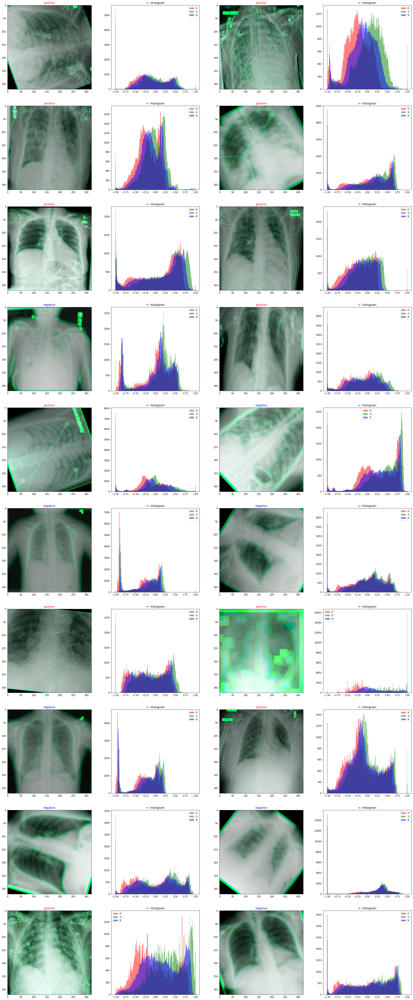

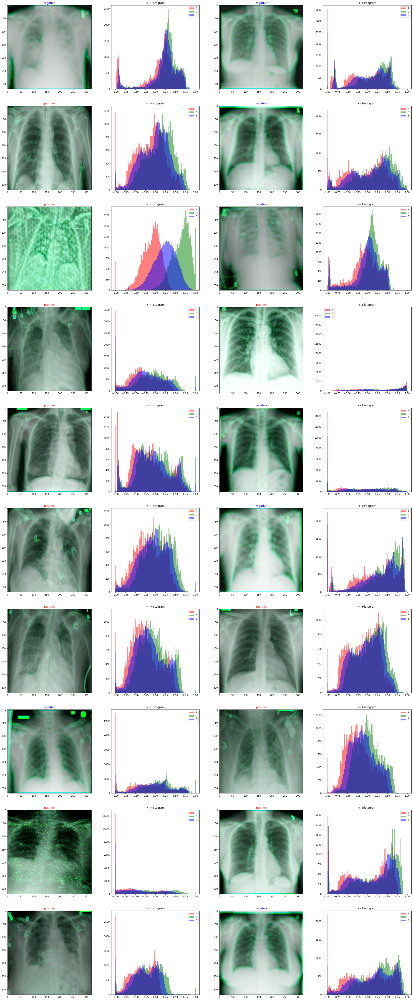

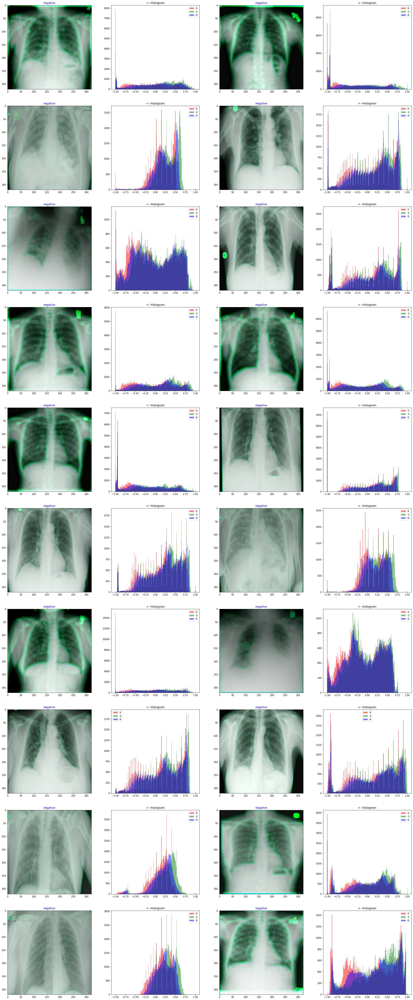

In [ ]:

# %% PRINT SAMPLE: ----- ----- ----- ----- ----- ----- ---
########################################
##### CONSTRUCT SAMPLE IMAGE PLOT ######
########################################
def plot_sample_from_dataloader(dataloader, tag:str, N_COLS = 4, N_MAX=20):
    N_MAX = min(SELECTED_NET_CONFIG.BATCH_SIZE, N_MAX)
    N_COLS = min(N_COLS, N_MAX)
    N_ROWS = int(np.ceil(N_MAX/N_COLS)) * 2
    fig, axes = plt.subplots(
        figsize=(N_COLS * 8, N_ROWS * 8), 
        ncols=N_COLS, nrows=N_ROWS
    )
    _print("=== Print Sample Data ({}) [n_display:{} / batch_size:{}]".format(
        tag, N_MAX, SELECTED_NET_CONFIG.BATCH_SIZE))
    # get one batch:
    images, labels = next(iter(dataloader))
    for i in range(N_MAX):
        print("\r   >[{}/{}]".format(i+1,N_MAX),  end='')
        # Plot img:
        id_ = i * 2
        ax = axes[int(id_/N_COLS), id_%N_COLS]
        # show remapped image, since the range was distorted by normalization
        ax.imshow((np.dstack((images[i][0], images[i][1], images[i][2])) + 1)/2, vmin=0, vmax=1)
        ax.set_title(
            "{}".format(INT_TO_LABEL_LUT[int(labels[i])]),
            color="red" if int(labels[i]) else "blue"
        )

        # Plot Hist:
        id_ += 1
        ax = axes[int(id_/N_COLS), id_%N_COLS]
        ax.hist(np.ravel(images[i][0]), bins=256, color='r', alpha = 0.5, range=[-1, 1])
        ax.hist(np.ravel(images[i][1]), bins=256, color='g', alpha = 0.5, range=[-1, 1])
        ax.hist(np.ravel(images[i][2]), bins=256, color='b', alpha = 0.5, range=[-1, 1])
        ax.legend(['R', 'G', 'B'])
        ax.set_title("<- Histogram")
        
    fig.savefig("{}/plot_{}.png".format(SELECTED_NET_CONFIG.OUT_DIR, tag), bbox_inches = 'tight')

if PRINT_SAMPLES:
    plot_sample_from_dataloader(train_dataloader, tag="training-sample")
    plot_sample_from_dataloader(valid_dataloader, tag="validation-sample")
    plot_sample_from_dataloader(competition_dataloader, tag="competition-sample")


In [ ]:
# %% DEFINE EVALUATION WITH COMPETITION TEST DATASET -------------------------------- %%
################################################################
##### DEFINE EVALUATION CALLBACK FOR COMPETITION PREDICTION ####
################################################################
from sklearn.metrics import confusion_matrix, classification_report
def evaluate_net(net, dataloader):
    _print("> Evaluation Begin ...")
    y_true = []
    y_pred = []
    for X, y in dataloader:
        if device != None:
            X = X.to(device)
            y = y.to(device)

        # Predict:
        y_prediction = net(X)

        # record:
        y_true.extend(y.cpu().detach().numpy())
        y_pred.extend(y_prediction.argmax(dim=1).cpu().detach().numpy())
    _print("> Evaluation Complete")
    return y_true, y_pred

def eval_competition(net, dataloader, tag):
    # eval:
    y_true, y_pred = evaluate_net(net=net, dataloader=dataloader)
    _print("> {3} +:{1}/{0} -:{2}/{0}".format(N_TEST, np.sum(y_pred), N_TEST-np.sum(y_pred), tag))

    OUT_FILE_PATH = "{}/y_pred[{}].txt".format(SELECTED_NET_CONFIG.OUT_DIR, tag)
    with open(OUT_FILE_PATH, "w") as file_out:
        file_out.write("\n".join(["{}".format(yi) for yi in y_pred]))



[ENGINE]  > epoch 1/100:
[ENGINE]    >> Learning (wip) 
   >[173/173]
[ENGINE]    >> Testing (wip) 
   >[8/8]
[ENGINE]      epoch 1 > Training: [LOSS: -0.8261 | ACC: 0.8382] | Testing: [LOSS: -0.9811 | ACC: 0.9875] Ellapsed: 92.47 s | rate:2.92293

[ENGINE]  > Found Best Model State Dict saved @/content/drive/MyDrive/dataset-folder/output/CUSTOM-MODEL/v6-custom-with-aug-9/models/best_state_dict_1:100.pth [False]
[ENGINE]  Best Classification Report:
----------------------
[ENGINE]                precision    recall  f1-score   support

    positive       0.99      0.98      0.99       200
    negative       0.99      0.99      0.99       200

    accuracy                           0.99       400
   macro avg       0.99      0.99      0.99       400
weighted avg       0.99      0.99      0.99       400

[ENGINE]  > Evaluation Begin ...
[ENGINE]  > Evaluation Complete
[ENGINE]  > best[1:100] +:219/400 -:181/400
[ENGINE]  > epoch 2/100:
[ENGINE]    >> Learning (wip) 
   >[173/173]
[ENGINE

/content/drive/MyDrive/dataset-folder/lib/jx_lib.py:124: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = plt.figure(figsize=figsize)


[ENGINE]  Best Classification Report:
----------------------
[ENGINE]                precision    recall  f1-score   support

    positive       0.95      1.00      0.98       200
    negative       1.00      0.95      0.97       200

    accuracy                           0.97       400
   macro avg       0.98      0.97      0.97       400
weighted avg       0.98      0.97      0.97       400

[ENGINE]  > Evaluation Begin ...
[ENGINE]  > Evaluation Complete
[ENGINE]  > best[21:100] +:166/400 -:234/400
[ENGINE]  > epoch 22/100:
[ENGINE]    >> Learning (wip) 
   >[173/173]
[ENGINE]    >> Testing (wip) 
   >[8/8]
[ENGINE]      epoch 22 > Training: [LOSS: -0.9486 | ACC: 0.9517] | Testing: [LOSS: -0.9805 | ACC: 0.9800] Ellapsed: 93.74 s | rate:2.99007

[ENGINE]  > Found Best Model State Dict saved @/content/drive/MyDrive/dataset-folder/output/CUSTOM-MODEL/v6-custom-with-aug-9/models/best_state_dict_22:100.pth [False]
[ENGINE]  Best Classification Report:
----------------------
[ENGINE]    

AttributeError: ignored

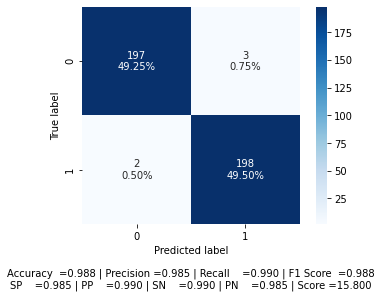

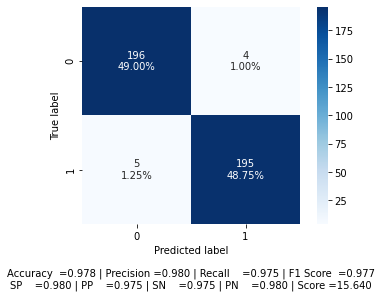

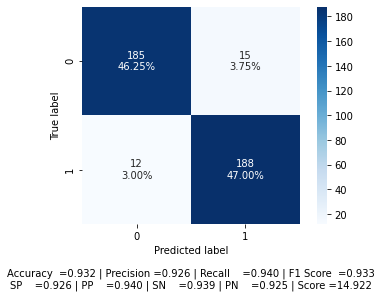

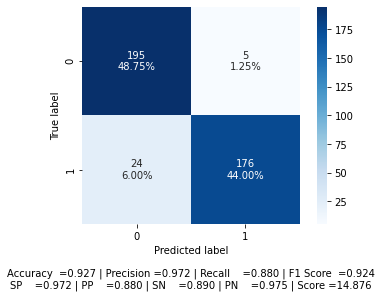

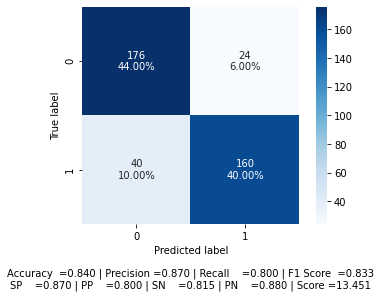

...

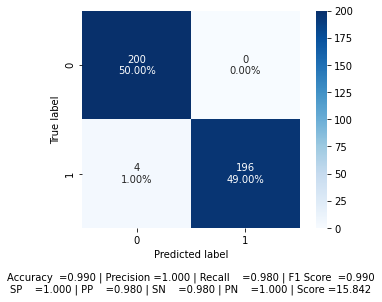

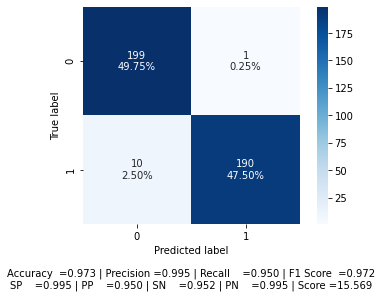

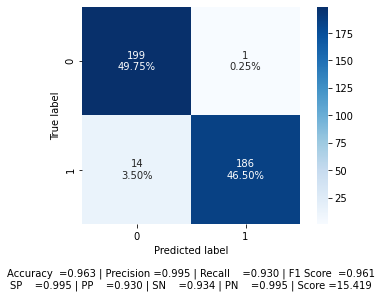

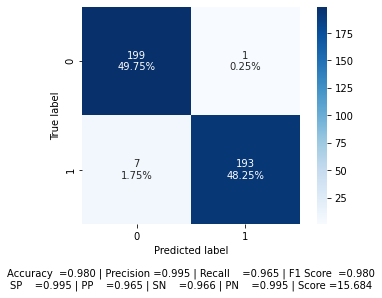

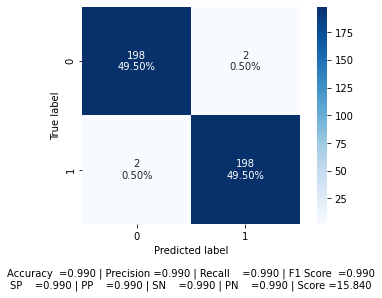

In [ ]:
# %% TRAIN: ----- ----- ----- ----- ----- ----- ---
#####################
###### M A I N ######
#####################
# Reload:
import importlib
importlib.reload(jx_pytorch_lib)
importlib.reload(jx_lib)
from jx_pytorch_lib import ProgressReport, VerboseLevel, CNN_MODEL_TRAINER

# run:
report, best_net = CNN_MODEL_TRAINER.train_and_monitor(
    device=device,
    train_dataset=train_dataloader,
    test_dataset=valid_dataloader, 
    optimizer=SELECTED_NET_CONFIG.OPTIMIZER, 
    loss_func=SELECTED_NET_CONFIG.LOSS_FUNC,
    net=SELECTED_NET_MODEL,
    num_epochs=SELECTED_NET_CONFIG.TOTAL_NUM_EPOCHS,
    model_output_path=SELECTED_NET_CONFIG.OUT_DIR_MODELS,
    target_names=LABEL_TO_INT_LUT,
    early_stopping_n_epochs_consecutive_decline=SELECTED_NET_CONFIG.EARLY_STOPPING_DECLINE_CRITERION,
    eval_func_competition=eval_competition,
    eval_data_competition=competition_dataloader,
    # max_data_samples=20,
    verbose_level= VerboseLevel.HIGH,
    _print=_print,
    save_model=OUTPUT_MODEL,
)

report.output_progress_plot(
    OUT_DIR=SELECTED_NET_CONFIG.OUT_DIR, 
    tag=SELECTED_NET_CONFIG.VERSION,
    verbose_level=VerboseLevel.HIGH
)

#eval:
eval_competition(net=best_net, dataloader=competition_dataloader, tag="best")
eval_competition(net=SELECTED_NET_MODEL, dataloader=competition_dataloader, tag="final")
